In [1]:
using Pkg
Pkg.activate("../..")

  Activating project at `~/Documents/repos/nanoOpt.jl`


In [2]:
using Measures,LinearAlgebra,LazyGrids,LaTeXStrings,QuadGK,Plots; pyplot()

Plots.PyPlotBackend()

In [3]:
include("../../src/NanoOpt.jl")

KsspSlab (generic function with 1 method)

In [4]:
mat1 = material((1.)^2,1.0)
matSc = material(epstable("gold"),1.0)
matScDr = material(epsdrude("Au"),1.0)
#matSc = material(-11.74+1.26*im,1.0)
mat2 = material((4.1+0.051787*im)^2,1.0);

In [5]:
(0.0657+im*4)^2

-15.99568351 + 0.5256im

In [6]:
λ = 532
k₀ = 2π/λ
d = 10;

In [7]:
layer = layerstructure([mat1,matSc,mat2],[0.0,d],"up");

In [8]:
kdS1 = KsspSlab(k₀,mat1,matSc)
kdS2 = KsspSlab(k₀,mat2,matSc);

In [9]:
layer.mat[1].ε(k₀)

1.0

In [10]:
N = 100
ns = collect(LinRange(0.01,0.015,N))
ins = collect(LinRange(0.0e-2,0.002,N));

In [11]:
nsM,insM = ndgrid(ns,ins)
nsA,insA = nsM[:],insM[:];

In [12]:
βT = (nsA+im*insA)

felA = [funSolv(β,k₀,layer) for β ∈ βT];

A = reshape(felA,size(nsM))

plotly()
heatmap(ns,ins,angle.(A)')

In [13]:
βRec = [ns[1], ns[end]]
βImc = [ins[1], ins[end]]

2-element Vector{Float64}:
 0.0
 0.002

In [14]:
βc = getβc(βRec,βImc,N,k₀,layer)

0.011792929292929293 + 1.0101010101010101e-5im

In [15]:
βS = NRSolver(βc,k₀,layer,1e-12)

0.011682507072259457 + 0.00039736168995117583im

In [16]:
funSolv(βS,k₀,layer)

-8.43769498715119e-15 - 4.929390229335695e-14im

In [17]:
nss = βS/k₀

0.9891628940722551 + 0.0336447850443739im

In [18]:
λspp = λ/real(nss)

537.8285044739448

In [19]:
lₛₚₚ = 1/(2k₀*imag(nss))

1258.2994602761917

In [20]:
nssApr = kdS1/k₀

1.0942692338902869 + 0.05670751166642472im

In [21]:
λ/real(nssApr)

486.16920180480844

In [22]:
1/(2k₀*imag(nssApr))

746.5539153168295

In [23]:
λspp/2

268.9142522369724

In [24]:
Λedge(74,-30,λ,nss)

523.6523562283132

In [25]:
Γ = 1/lₛₚₚ

xg = 0:0.1:14000

elmA = @. exp(-Γ/2*xg)

plot(xg,elmA)

## LR-spp

In [26]:
Nel = 18
N = 100
ns = collect(LinRange(0.012,0.0136,N))
ins = collect(LinRange(0.0e-2,0.0007,N))

#N = 100
#ns = collect(LinRange(0.012,0.0136,N))
#ins = collect(LinRange(0.0e-2,0.00006,N))

#dAlr = 40:10:200
#dAlr = collect(LinRange(37.31,200,Nel))
dAlr = collect(LinRange(20,200,Nel))
nLR = zeros(length(dAlr))*im
for i in eachindex(dAlr)
    βRec = [ns[1], ns[end]]
    βImc = [ins[1], ins[end]]
    
    layer = layerstructure([mat1,matSc,mat2],[0.0,dAlr[i]],"up")
    βc = getβc(βRec,βImc,N,k₀,layer)
    βS = NRSolver(βc,k₀,layer,1e-12)
    nLR[i] = βS/k₀
end

## sR-spp

In [27]:
N = 100
ns = collect(LinRange(0.01,0.047,N))
ins = collect(LinRange(0.01,0.09,N))

#N = 100
#ns = collect(LinRange(0.01,0.047,N))
#ins = collect(LinRange(0.01,0.09,N))

dASr = collect(LinRange(20,200,Nel))
nSR = zeros(length(dASr))*im
for i in eachindex(dASr)
    βRec = [ns[1], ns[end]]
    βImc = [ins[1], ins[end]]
    
    layer = layerstructure([mat1,matSc,mat2],[0.0,dASr[i]],"up")
    βc = getβc(βRec,βImc,N,k₀,layer)
    βS = NRSolver(βc,k₀,layer,1e-12)
    nSR[i] = βS/k₀
end

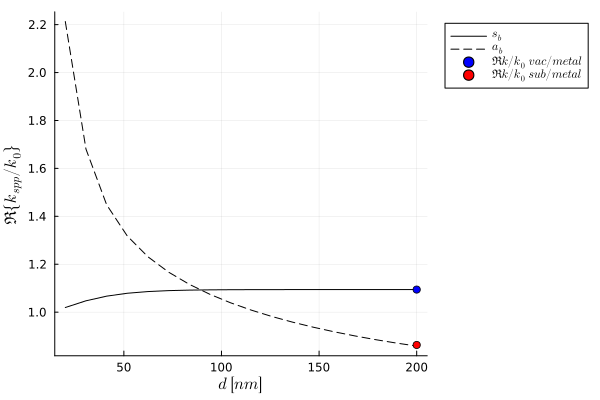

In [28]:
gr()

plot(dAlr,real(nLR),c=:black,label=L"s_b")
plot!(dASr,real(nSR),c=:black,ls=:dash,label=L"a_b")
scatter!([dASr[end],],real([kdS1 kdS2]./k₀),label=[L"\Re{k/k_0}~vac/metal" L"\Re{k/k_0}~sub/metal"],c=[:blue :red],xlabel=L"d~[nm]",ylabel=L"\Re\{k_{spp}/k_0\}"
    ,legend=:outertopright)

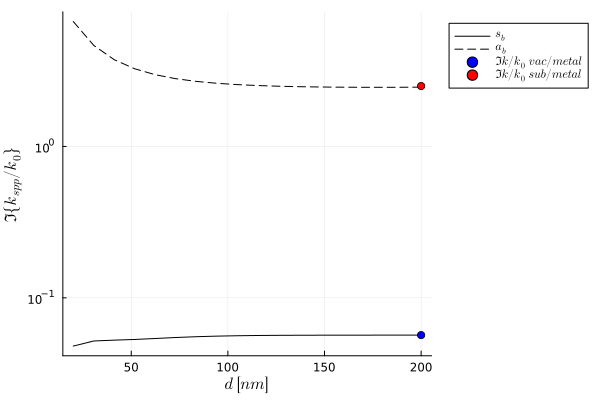

In [30]:
gr()

 plot(dAlr,imag(nLR),c=:black,label=L"s_b")
p1 = plot!(dASr,imag(nSR),c=:black,ls=:dash,yscale=:log10,label=L"a_b")
scatter!([dASr[end],],imag([kdS1 kdS2]./k₀),label=[L"\Im{k/k_0}~vac/metal" L"\Im{k/k_0}~sub/metal"],c=[:blue :red],xlabel=L"d~[nm]",ylabel=L"\Im\{k_{spp}/k_0\}"
    ,legend=:outertopright)